A single-link pendulum with torque applied to the pivot point and no friction has the dynamics:
$$ 
\dot{x} = \begin{bmatrix} x_2 \\ - \frac{g}{l} \sin(x_1) \end{bmatrix} + \begin{bmatrix} 0 \\ 1 \end{bmatrix}u
$$ 


In [3]:
from systems.pendulum import simulate_pendulum, make_animation
from IPython.display import HTML
import numpy as np
from matplotlib import pyplot as plt

def controller(x, t):
    u = 0
    return u

# Setup
x0 = [-np.pi/2.2, 0]    # initial conditions.
tVec = np.linspace(0,10,500)

# Animation
theta_vec, thetadot_vec, dt = simulate_pendulum(x0, tVec, controller)
anim = make_animation(dt, theta_vec)
plt.close()
HTML(anim.to_jshtml())

We can show enforce reference tracking via an input-output linearizing controller. Specifically, we command the output:
$$ y = x_1 - a * \sin(\frac{2 \pi t}{T})$$
with $a$ being a desired amplitude, and $T$ being a desired period. Our IO-linearizing controller becomes:

$$ u = \frac{g}{l}\sin(x_1) - k_1 y - k_2 \dot{y}$$ 

In [5]:
from systems.pendulum import get_params
def io_controller(x,t):
    
    epsilon = 100
    L, g = get_params()
    
    period = 0.5
    xdes = np.deg2rad(45) * np.sin(2 * np.pi * t / period)  # Desired position in radians
    dxdes = np.deg2rad(45)*np.cos(2 * np.pi * t / period) * (2 * np.pi / period)  # Desired velocity in radians/sec
    v  = - (epsilon**2 * (x[0]-xdes)) - (2*epsilon * (x[1]-dxdes))
    u = (g/L)*np.sin(x[0]) + v
    
    return u

# Animation
thetavec, thetadotvec_io, dt = simulate_pendulum(x0, tVec, io_controller)
anim = make_animation(dt, thetavec)
plt.close()
HTML(anim.to_jshtml())

We can add a condition that limits the pendulum velocity via the CBF condition:
$$ \dot{h} \geq -\alpha(h(x)) $$
with the control barrier function $h(x) = v_{max}^2 - x_1^2$ and a constant function $\alpha(x) = c$

In [10]:
import cvxpy as cp

def cbf_controller(x, t):
    
    # Get desired input from io_controller
    u_des = io_controller(x, t)
    
    # Get f(x) and g(x) 
    L, g = get_params()
    fx = np.array([x[1], -g/L*np.sin(x[0])])
    gx = np.array([0, 1])
    
    # Define CBF components 
    vmax = 5
    def h(x):
        h = vmax**2 - x[1]**2
        return h
    dhdx = np.array([0, -2*x[1]])
    
    def Lf_h(x):
        return dhdx @ fx  

    def Lg_h(x):
        return dhdx @ gx  

    alpha_const = 10

    if Lg_h(x) == 0 and Lf_h(x) + alpha_const * h(x) < 0:
        raise ValueError("Lg_h(x) * u cannot be zero. Adjust the control barrier function or system dynamics.")

    # Quadratic Program
    u = cp.Variable(1)
    cost = cp.quad_form(u - u_des, np.eye(1))
    
    cbf_constraint = Lf_h(x) + Lg_h(x) * u + alpha_const * h(x) >= 0
    
    prob = cp.Problem(cp.Minimize(cost), [cbf_constraint])
    prob.solve()

    # Use this control input
    u_safe = u.value

    if prob.status != cp.OPTIMAL:
        print("Problem is not optimal Using default controller.")
        u_safe = u_des
    else:
        u_diff = u.value - u_des
        # print("Control input difference:", u_diff)
    
    return u_safe

# Animation
theta_vec, thetadotvec_cbf, dt = simulate_pendulum(x0,tVec, cbf_controller)
anim = make_animation(dt, theta_vec)
plt.close()
HTML(anim.to_jshtml())

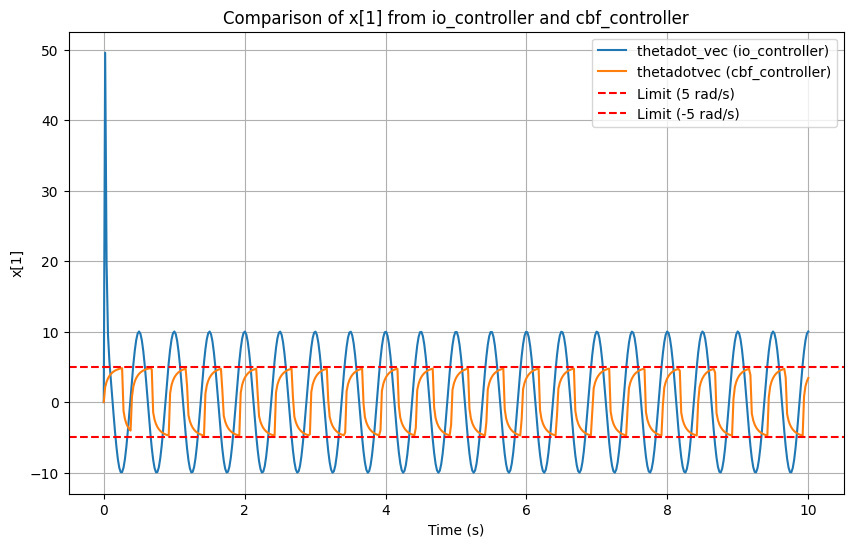

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(tVec, thetadotvec_io, label='thetadot_vec (io_controller)')
plt.plot(tVec, thetadotvec_cbf, label='thetadotvec (cbf_controller)')
plt.axhline(y=5, color='r', linestyle='--', label='Limit (5 rad/s)')
plt.axhline(y=-5, color='r', linestyle='--', label='Limit (-5 rad/s)')
plt.xlabel('Time (s)')
plt.ylabel('x[1]')
plt.title(r('Comparison of $\dot{\theta}$ from io_controller and cbf_controller'))
plt.legend()
plt.grid()
plt.show()